### 統計學習初論 (Spring, 2019)
### Homework 4
#### 截止日期: 9AM, 2019/4/30

請將HTML檔上傳至Ceiba作業區。回答作業時建議使用 "三明治" 答題法。也就是說，先說明要做什麼，然後列出程式碼與結果，最後說明這些結果的意義。作業自己做。嚴禁抄襲。不接受紙本繳交，不接受遲交。請以英文或中文作答。

#### Data Visualization via Dimensionality Reduction
Data visualization is an useful technique that is often used to understand the characteristics of a dataset. We are going to practice this skill using a university department offer of admission dataset. 

#### Dataset: University Department Offer of Admission Dataset (UDOAD; 大學推薦甄選資料集)
A large portion of high school students get admitted to universities through an application and screening process that require each university department of offer admission to applicants first before students can choose where they wants to go. If we think of applicants as the customers of an academic department, then the duplications of offered applicants for different departments can be used to understand the competition relationships between academic departments. We are going to visualize this competition relationships using the University Department Offer of Admission Dataset (UDOAD). 

UDOAD was collected through a popular online offer searching service (https://freshman.tw/) for the 2017 academic year. We collected the offers recieved by each applicant as well as the basic information for academic departments. This dataset contains two files
* student_admission106.csv: the offers received by each student applicant. 
* univ_name106short1.csv: the basic information, such as the name and field of academic departments. 

Below is the first few records of these two files:

In [1]:
%matplotlib inline              
import numpy as np 
import pandas as pd
 
stu_adm = pd.read_csv('ds/student_admission106.csv', encoding="utf-8", dtype=str) 
uname = pd.read_csv('ds/univ_name106short1.csv', encoding="utf-8", dtype=str)
 
all_depid = stu_adm['department_id'].unique() 
all_stuid = stu_adm['student_id'].unique()
 
ndepid = all_depid.shape[0] 
nstuid = all_stuid.shape[0] 
print("There are %d students and %d departments in total." % (nstuid, ndepid))
 
print("offers received by students:") 
stu_adm.head(10)

There are 60461 students and 1976 departments in total.
offers received by students:


,school_id,department_id,student_id,student_name,state,location1,location2
0,001,001012,10246842,黃士玹,正1,南部,台南考區
1,001,001012,10042237,黃冠婷,正2,北部,台北考區
2,001,001012,10008031,鍾大方,正3,北部,台北考區
3,001,001012,10201525,曾信豪,正4,中部,彰化考區
4,001,001012,10014615,陳品儒,正5,北部,台北考區
5,001,001012,10294018,侯思筠,正6,東部,宜蘭考區
6,001,001012,10022810,吳悅慈,正7,北部,台北考區
7,001,001012,10236223,陳俞潔,正8,南部,台南考區
8,001,001012,10025909,蕭宇廷,正9,北部,台北考區
9,001,001012,10123708,吳岱軒,正10,北部,中壢考區


The department_id can uniquely identify an academic department. We do not care about the ranking of admission here, and you should just ignore the "state" column. We only care about the "co-application" relations in this dataset. You should use student_id to uniquely identify a student applicant. 

In [2]:
print("academic department basic information:")
uname.head(10)

academic department basic information:


,year,school_id,department_id,school_name,department_name,category_id,category_name,school_name_abbr,department_name_abbr
0,106,006,006042,國立政治大學,教育學系,1,教育,政大,教育
1,106,006,006052,國立政治大學,教育學系(公費生),1,教育,政大,教育(公)
2,106,006,006062,國立政治大學,教育學系(原住民公費生),1,教育,政大,教育(原住民)
3,106,006,006022,國立政治大學,歷史學系,2,藝術及人文,政大,歷史
4,106,006,006152,國立政治大學,民族學系,2,藝術及人文,政大,民族學
5,106,006,006032,國立政治大學,哲學系,2,藝術及人文,政大,哲學
6,106,006,006262,國立政治大學,英國語文學系,2,藝術及人文,政大,英國語文
7,106,006,006292,國立政治大學,日本語文學系,2,藝術及人文,政大,日本語文
8,106,006,006272,國立政治大學,阿拉伯語文學系,2,藝術及人文,政大,阿拉伯語文
9,106,006,006302,國立政治大學,韓國語文學系,2,藝術及人文,政大,韓國語文


You can use this dataset to identify the name of a department_id. The school_name and department_name contain the "full name" of a academic department. To facilitate visualization, we also provide "shorter names" in school_name_abbr and department_name_abbr. The category_name is the field of an academic department. This field is very important in our visualization exercise since you should color each data point according to its category_name. 

#### Implementation Restriction
You are allowed to use any Python libraries in your solution. 

### Question 1 [Data Preparation]
(20%) Our focus is the relationships between department. In order to do this we need to convert the raw data into a "matrix" representation. Each row represent an academic department, and each column represent a student applicant. The value of the cell is 1 if a student applied for admission to the corresponding academic department, and 0 otherwise. 

To avoid potential numerical problems, we only include an academic department if it received ten or more applications. Moreover, we only include a student applicant if he or she applied for more than one academic department. You need to make sure that both conditions are satisfied in your processed dataset. 

Note that the two conditions should be satisfied "as is" in your final dataset. For example, if a student applied for two departments in the original dataset, and one of the department was removed, then this student should be removed as well because the student only applied for one department in the processed dataset. 

Answer the following question:
* Q1.1: Report the number of academic department and student applicants in your dataset. 
* Q1.2: Report the top ten departments that recieved the most applications and the number of applications they received. Identify the department by their department_id and names. 

***
#### Solution

Start by reading in the dataset. 

In [3]:
%matplotlib inline
import numpy as np
import pandas as pd

stu_adm = pd.read_csv('ds/student_admission106.csv', encoding="utf-8", dtype=str)
uname = pd.read_csv('ds/univ_name106short1.csv', encoding="utf-8", dtype=str)

all_depid = stu_adm['department_id'].unique()
all_stuid = stu_adm['student_id'].unique()

ndepid = all_depid.shape[0]
nstuid = all_stuid.shape[0]
print("In raw data, there are %d students and %d departments in total." % (nstuid, ndepid))

#construct the department-student matrix (i.e. array). 
dep_stu = np.zeros((ndepid, nstuid))
rowname = all_depid.copy()
 
depid_seq_map = dict() 
for i in range(ndepid):    
    depid_seq_map[all_depid[i]] = i

stuid_seq_map = dict() 
for i in range(nstuid):    
    stuid_seq_map[all_stuid[i]] = i
#print(depid_seq_map.items())

for cindex, row in stu_adm.iterrows():    
    #print(cindex, row)    
    dep_seq = depid_seq_map[row['department_id']]    
    stu_seq = stuid_seq_map[row['student_id']]    
    #print(dep_seq, stu_seq)    
    dep_stu[dep_seq, stu_seq] = 1


#Remove very small departments.
min_stu_per_dep = 10 
min_apply_dep_per_stu = 2
 
#remove small departments and single-application students. 
dep_apply_sum = np.sum(dep_stu, axis = 1) 
keeprow = dep_apply_sum >= min_stu_per_dep 
rowname = rowname[keeprow] 
dep_stu2 = dep_stu[keeprow,:] 
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]
 
#another run of filtering 
dep_apply_sum = np.sum(dep_stu2, axis = 1) 
dep_stu2 = dep_stu2[dep_apply_sum >= min_stu_per_dep,:] 
rowname = rowname[dep_apply_sum >= min_stu_per_dep] 
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]
 
#third run of filtering 
dep_apply_sum = np.sum(dep_stu2, axis = 1) 
dep_stu2 = dep_stu2[dep_apply_sum >= min_stu_per_dep,:] 
rowname = rowname[dep_apply_sum >= min_stu_per_dep]
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
dep_stu2 = dep_stu2[:, stu_apply_sum >= min_apply_dep_per_stu]

#check to make sure the two conditions are satisfied. 
dep_apply_sum = np.sum(dep_stu2, axis = 1) 
print("Number of department too small:", np.sum(dep_apply_sum < min_stu_per_dep)) 
stu_apply_sum = np.sum(dep_stu2, axis = 0) 
print("Number of students applying only one department:", np.sum(stu_apply_sum <min_apply_dep_per_stu))
 

In raw data, there are 60461 students and 1976 departments in total.
Number of department too small: 0
Number of students applying only one department: 0


##### Q1.1
We are now ready to answer Q1.1

In [4]:
num_dep, num_stu = dep_stu2.shape
print("In final dataset, there are", num_dep, "academic departments and", num_stu, "student applicants.")

In final dataset, there are 1917 academic departments and 47386 student applicants.


#### Q1.2
To answer this question, we need to construct the department name variable first

In [5]:
uname['depname'] = uname.school_name_abbr + uname.department_name_abbr
uname2 = uname[['department_id', 'depname', 'category_name']].copy()
print(uname2.head(10))

  department_id    depname category_name
0        006042       政大教育            教育
1        006052    政大教育(公)            教育
2        006062  政大教育(原住民)            教育
3        006022       政大歷史         藝術及人文
4        006152      政大民族學         藝術及人文
5        006032       政大哲學         藝術及人文
6        006262     政大英國語文         藝術及人文
7        006292     政大日本語文         藝術及人文
8        006272    政大阿拉伯語文         藝術及人文
9        006302     政大韓國語文         藝術及人文


In [6]:
#this is for later use, to color data points. 
category_id, category_levels = pd.factorize(uname2.category_name,sort='TRUE') ######## sort='TRUE'
#print(category_id[0:10])
#uname2['category_id'] = category_id / np.max(category_id)
uname2['category_id'] = category_id
print(uname2.head(10))

  department_id    depname category_name  category_id
0        006042       政大教育            教育            3
1        006052    政大教育(公)            教育            3
2        006062  政大教育(原住民)            教育            3
3        006022       政大歷史         藝術及人文            7
4        006152      政大民族學         藝術及人文            7
5        006032       政大哲學         藝術及人文            7
6        006262     政大英國語文         藝術及人文            7
7        006292     政大日本語文         藝術及人文            7
8        006272    政大阿拉伯語文         藝術及人文            7
9        006302     政大韓國語文         藝術及人文            7


In [7]:
#create a data frame for column name
colname_df = pd.DataFrame({'department_id': rowname})
colname_df = colname_df.merge(uname2, how = "left", on="department_id")
colname_df.head(10)

,department_id,depname,category_name,category_id
0,001012,臺大中文,藝術及人文,7
1,001022,臺大外文,藝術及人文,7
2,001032,臺大歷史,藝術及人文,7
3,001042,臺大哲學,藝術及人文,7
4,001052,臺大人類學系,藝術及人文,7
5,001062,臺大圖書資訊,社會科學、新聞學及圖書資訊,5
6,001072,臺大日本語文,藝術及人文,7
7,001082,臺大戲劇,藝術及人文,7
8,001092,臺大數學,自然科學、數學及統計,6
9,001102,臺大物理,自然科學、數學及統計,6


In [8]:
#print(dep_apply_sum)   # 57. 120. ... 123.
topdepid = np.argsort(dep_apply_sum)[::-1]  #the top ten's index
#topdepid 


topn = 10
topdep = pd.DataFrame({'department_id': rowname[topdepid[0:topn]], 
                       'department_name': colname_df.depname.values[topdepid[0:topn]],
                       'num_applicant': dep_apply_sum[topdepid[0:topn]]
                       }) 
topdep

,department_id,department_name,num_applicant
0,008122,中原機械工程學,386.0
1,012052,中醫藥學,376.0
2,046032,銘傳會計（臺北）,367.0
3,004382,成大電機,357.0
4,005192,東吳企業管理,353.0
5,008112,中原土木,353.0
6,005182,東吳會計,351.0
7,015342,逢甲財金,340.0
8,045012,義守電機,339.0
9,046162,銘傳應用英語（桃園）,329.0


### Question 2 [Explore]
(50%) Visualize academic departments in the following questions. In all plots, you should color data points according the academic department's category. Moreover, you should provide a legend or a picture that illustrate the mapping between colors and category names. Visualize the data using two-dimensional plots. Note that it is your responsible to study the document of libraries of your choice and make sure that the results are reasonable. 
* Q2.1: Visualize academic departments using the first 8 principle components. Use your judegement to select multiple pairs of principle components to visualize. Discuss the visual patterns with respect to department categories. 
* Q2.2: Visualize academic department using multiple dimensional scaling. Consdier both the metric and non-metric settings. Discuss the result. 
* Q2.3: Visualize academic department using Locally Linear Embedding. Consider three variations: (1) Use 20 neighbors to construct the weight matrix; (2) Use 40 neighbors to construct the weight matrix; (3) Perform PCA transformation first, and use the first 100 principle components as the input to LLE (with 20 neighbors). Discuss the result. 
* Q2.4: Visualize academic department using Kernel PCA. You should at least consider the RBF and Cosine kernel. It is your responsibility to select reasonably good kernel parameters. Discuss the result. 
* Q2.5: Visualize academic department using t-SNE. You should consider at least the Euclidian, Cosine, and Jaccard metric. Set numpy random seed so that your results can be repeated. Discuss the result. 

***
#### Solution
##### Q2.1
First define the utility function for plotting results.

In [9]:
#first define an utility function for plotting result
from matplotlib.font_manager import FontProperties
from matplotlib import pyplot as plt

ChineseFont2 = FontProperties(fname='C:\\Windows\\Fonts\\mingliu.ttc')
def plot_result(x, y, record_cluster, name, colorid, addname = True, fontsize = 6, markersize = 20,
                dpi = 200, datascale = 1.0, outfn = 'univdep.png', title = None):
    
    x = x * datascale
    y = y * datascale
    record_cluster = record_cluster * datascale
    
    fig, ax = plt.subplots(dpi = dpi)
    #ax.invert_xaxis()
    #ax.invert_yaxis()
    #ax.scatter(x, y, s = markersize, c = colorid, cmap=plt.cm.get_cmap('rainbow'), alpha = 0.8)
    if title != None:
        ax.set_title(title)
    ax.scatter(x, y, s = markersize, color = colorid, alpha = 0.8)


    nameshift = np.sqrt(markersize) / 2
    if addname == True:
        for i, txt in enumerate(name):
            #txt = txt + str(record_cluster[i])
            ax.annotate(txt, (x[i] + nameshift, y[i]), size = fontsize, color = 'gray', fontproperties=ChineseFont2)
    plt.show()
    #plt.savefig('univdep.svg')
    
    plt.savefig(outfn)
    #plt.close(fig)


Generate the legend for the mapping between color and department category. 

In [10]:
from matplotlib.font_manager import FontProperties
from matplotlib import pyplot as plt

category_df = colname_df[['category_name', 'category_id']].copy()
category_df = category_df.drop_duplicates().sort_values(['category_id'])
print(category_df)

     category_name  category_id
90              其他            0
45        商業、管理及法律            1
28        工程、製造及營建            2
60              教育            3
158             服務            4
5    社會科學、新聞學及圖書資訊            5
8       自然科學、數學及統計            6
0            藝術及人文            7
50          資訊通訊科技            8
33     農業、林業、漁業及獸醫            9
20       醫藥衛生及社會福利           10


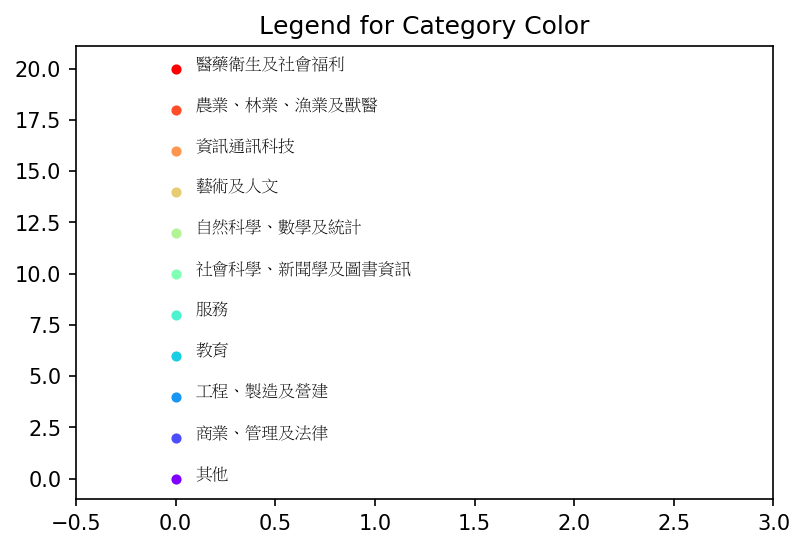

In [11]:
#original, from teacher
ncategory = category_df.shape[0]

colors = plt.cm.rainbow(np.linspace(0, 1, ncategory))

fig, ax = plt.subplots(dpi = 150)
ax.set_title("Legend for Category Color")
ax.set_xlim([-0.5, 3])
for i in range(category_df.shape[0]):
    thecolor = colors[category_df.category_id.values[i]]
    name = category_df.category_name.values[i]    
    x = 0
    y = 2 * i    
    ax.scatter(x, y, s = 15, color = thecolor)    
    ax.annotate(name, (x+0.1, y), fontsize=8,  fontproperties=ChineseFont2)
#plt.savefig("plot_legend.png")
plt.show()

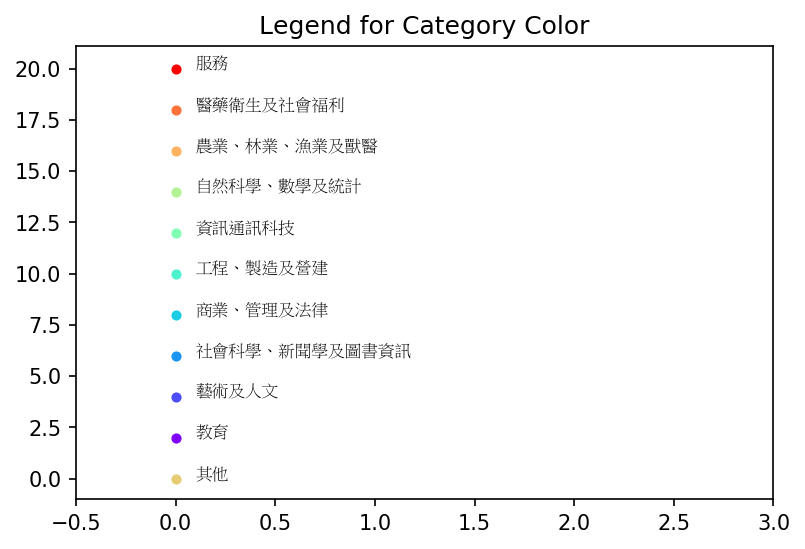

In [12]:
#my #use this one!!!
ncategory = category_df.shape[0]

#colors = plt.cm.rainbow(np.linspace(0,1, ncategory))
x = [0.7, 0.3, 0.4, 0, 1 , 0.2, 0.6, 0.1, 0.5 ,0.75 , 0.85]
colors = plt.cm.rainbow(x)

fig, ax = plt.subplots(dpi = 150)
ax.set_title("Legend for Category Color")
ax.set_xlim([-0.5, 3])
show_order = [0,3,7,5,1,2,8,6,9,10,4]
j = 0
for i in show_order:
    #print(category_df.category_name.values[i]  )
    thecolor = colors[category_df.category_id.values[i]]
    name = category_df.category_name.values[i]        ###  
    x = 0
    y = 2 * j    
    ax.scatter(x, y, s = 15, color = thecolor)    
    ax.annotate(name, (x+0.1, y), fontsize=8,  fontproperties=ChineseFont2)
    j+=1
#plt.savefig("plot_legend.png")
plt.show()



Now we are ready to visualize academic department using principle components. 

In [13]:
import matplotlib.pyplot as plt 
 
#define department colors. 
dep_color = colors[colname_df.category_id.values]
dep_color

array([[0.30392157, 0.30315267, 0.98816547, 1.        ],
       [0.30392157, 0.30315267, 0.98816547, 1.        ],
       [0.30392157, 0.30315267, 0.98816547, 1.        ],
       ...,
       [0.3       , 0.95105652, 0.80901699, 1.        ],
       [0.3       , 0.95105652, 0.80901699, 1.        ],
       [0.3       , 0.95105652, 0.80901699, 1.        ]])

#### Q2.5
t-SNE Visualization. Start with the Euclidean distance metric. I set the verbose to 1 in order to see more timely message. Other parameters were adjusted according to several attemps to generate the picture. 

In [14]:
from sklearn.manifold import TSNE
np.random.seed(1001)

tsne_jac = TSNE(n_components=2, metric='jaccard', verbose=1, perplexity=10, learning_rate=15)
tsne_jac_dep = tsne_jac.fit_transform(dep_stu2)
#plot_result(tsne_jac_dep[:,0], tsne_jac_dep[:,1], colname_df['depname'], dep_color, dpi = 150, addname = False, title = "t-SNE with Jaccard metric")


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1917 samples in 8.000s...
[t-SNE] Computed neighbors for 1917 samples in 542.919s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1917
[t-SNE] Computed conditional probabilities for sample 1917 / 1917
[t-SNE] Mean sigma: 0.141301
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.776230
[t-SNE] KL divergence after 1000 iterations: 1.325102


### Q3 Solution
Based on the results in Question 2, I selected the t-SNE with Jaccard metric to refine. To address the data overlapping problem, I created an unclutter function, this function use a hierarchical clustering algorithm to identify overlapping points and rearrange these points to become less clutter. This method did not solve 100% of the problem. However, this function can fix a large portion of overlapped data points.

In [15]:
#original version
def unclutter(tsne_dep2, threshold = 1.1, newdistrate = 1.4, xaxisrate = 0.3, linkcomp = 'average'):
    #try do de-clutter.
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

    tsne_dep2a = tsne_dep2.copy()
    #threshold = 1.1
    newdist = (threshold + 0.01) / newdistrate
    #construct a weighted version
    tmp_tsne = tsne_dep2a.copy()
    tmp_tsne[:,0] = tmp_tsne[:,0] * xaxisrate   #aggresively cluster x-axis neighbors
    linked = linkage(tmp_tsne, linkcomp)
    clus1 = fcluster(linked, t = threshold, criterion = 'distance')

    ncluster = 0
    record_cluster = np.zeros((1917))
    for clus_id in range(1,np.max(clus1)+1 ):  #np.max(clus1)+1
        #clus_id = 1
        tmpind = clus1 == clus_id
        record_cluster[tmpind] = clus_id #--------------------------------------
        
        npoint = np.sum(tmpind)
        if npoint <= 1:
            continue
        ncluster += 1
        x0 = tsne_dep2a[tmpind,:]
        center = np.mean(x0, axis = 0)

        direction = np.zeros((npoint, 2))
        for i in range(npoint):
            direction[i,:] = np.array([0.0, (i - npoint/2) * newdist])

        newx0 = center + direction

        tsne_dep2a[tmpind,:] = newx0
        #if clus1 > 5:
        #    break
    print("unclutter: identified", ncluster, "clusters")
    #print(record_cluster)
    return(tsne_dep2a,record_cluster)

unclutter: identified 550 clusters


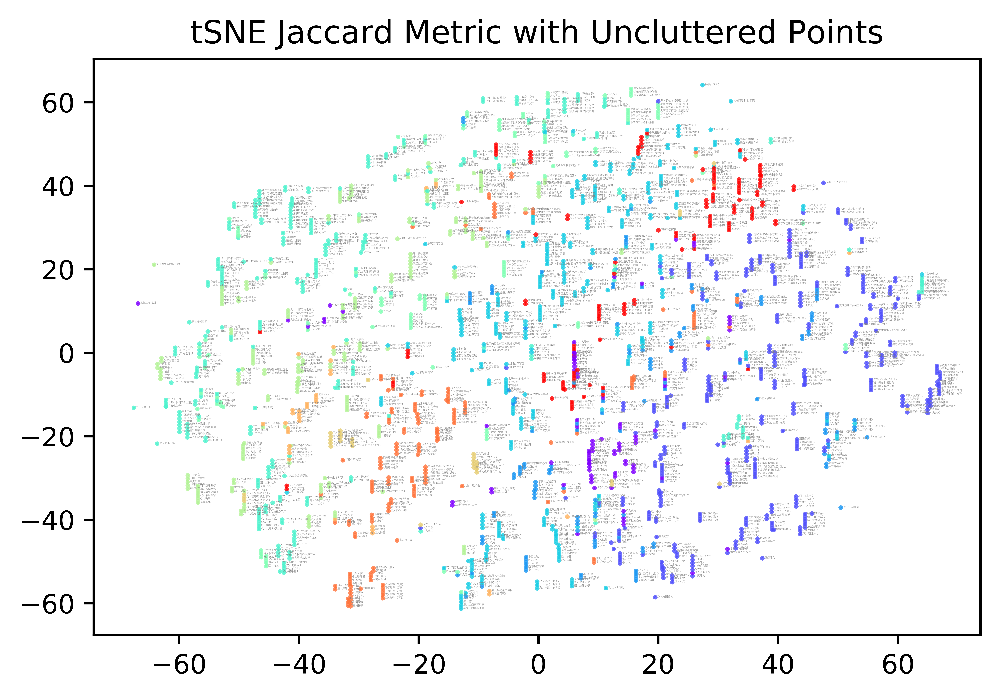

<Figure size 432x288 with 0 Axes>

In [16]:
tsne_jac_dep2,record_cluster = unclutter(tsne_jac_dep, linkcomp = 'centroid')

plot_result(tsne_jac_dep2[:,0], tsne_jac_dep2[:,1],record_cluster,
            colname_df['depname'], dep_color, addname = True, fontsize = 1, 
            title = 'tSNE Jaccard Metric with Uncluttered Points',
            markersize= 0.5, dpi = 1200, datascale = 1, outfn = 'univdep_tsne_jac1.png')

In [17]:
### my-solv. decentralization

In [18]:
def unclutter(tsne_dep2, threshold = 1.1, newdistrate = 1.4, xaxisrate = 0.3, linkcomp = 'average'):
    #try do de-clutter.
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
    #from matplotlib import pyplot as plt

    tsne_dep2a = tsne_dep2.copy()

    #threshold = 1.1
    newdist = (threshold + 0.01) / newdistrate
    #construct a weighted version
    tmp_tsne = tsne_dep2a.copy()

    tmp_tsne[:,0] = tmp_tsne[:,0] * xaxisrate   #aggresively cluster x-axis neighbors
    linked = linkage(tmp_tsne, linkcomp)
    clus1 = fcluster(linked, t = threshold, criterion = 'distance')

    ncluster = 0
    center_record = np.zeros((750, 2))      #total 618 clusters-------------
    npoint_record = np.zeros((750))         #---750*1 array---------------------             

    record_cluster = np.zeros((1917))       #----------------------------------#
    for clus_id in range(1,np.max(clus1)+1 ):  #np.max(clus1)+1
        #clus_id = 1
        tmpind = clus1 == clus_id
        record_cluster[tmpind] = clus_id     #----------------------------#
        npoint = np.sum(tmpind)
        npoint_record[clus_id] = npoint
        if npoint > 1:
            ncluster += 1
            x0 = tsne_dep2a[tmpind,:]
            center = np.mean(x0, axis = 0)    
            cen_x = center[0,]                  #---get x value----------------
            cen_y = center[1,]                  #---get y value----------------

            #check center overlap
            cnt = 0

            for i in range(1, clus_id):         #-----adjust center-----------------#
                if np.sum(center_record[i,:]-center) <=5 : 
                    if cen_x > 0:
                        xpos = cen_x*0.1
                    else: 
                        xpos = -cen_x*0.15
                    if cen_y > 0:
                        ypos = cen_y*0.2
                    else: 
                        ypos = -cen_y*0.15
                    center = center + [xpos,ypos]
                    #print(npoint_record[i])
                    cnt += 1
                    if(npoint_record[i]*30 > cnt):
                        break

            cen_x = center[0,]
            cen_y = center[1,] 
            center_record[clus_id,0] = cen_x    
            center_record[clus_id,1] = cen_y
            #print(center_record[clus_id,0])

            direction = np.zeros((npoint, 2))        
            x0 = tsne_dep2a[tmpind,:]
            for i in range(npoint):
                direction[i,:] = np.array([0.0, npoint-0.8*(i-1) ])  #(i-npoint/2) * newdist  ------------------

            newx0 = center + direction 
            
        else:                            #npoint == 1
            x0 = tsne_dep2a[tmpind,:]
            newx0 = np.mean(x0, axis = 0)
            #print(clus_id)
            
            
            
        #-----adjust the point (the whole cluster) position-----------------------------------------------------

        if clus_id ==1:
            newx0 = newx0 + [3,0]  
        elif clus_id ==6:
            newx0 = newx0 + [0,7]
        elif clus_id ==8:
            newx0 = newx0 + [-5,-2]
        elif clus_id ==10:
            newx0 = newx0 + [0,6]
        elif clus_id ==13:
            newx0 = newx0 + [0,3]
        elif clus_id ==20:
            newx0 = newx0 + [0,7]
        elif clus_id ==21:
            newx0 = newx0 + [-4,0]
        elif clus_id ==22:
            newx0 = newx0 + [0,-3]
        elif clus_id ==28:
            newx0 = newx0 + [0, 6]
        elif clus_id ==31:
            newx0 = newx0 + [0,1]
        elif clus_id ==32:
            newx0 = newx0 + [0,-2]
        elif clus_id ==37:
            newx0 = newx0 + [2,1]
        elif clus_id ==38:
            newx0 = newx0 + [5,-3.5]
        elif clus_id ==41:
            newx0 = newx0 + [3,3]
        elif clus_id ==44:
            newx0 = newx0 + [2,0]
        elif clus_id ==48:
            newx0 = newx0 + [-2,0]
        elif clus_id ==51:
            newx0 = newx0 + [-4,0.5]
        elif clus_id ==56:
            newx0 = newx0 + [5,0]
        elif clus_id ==57:
            newx0 = newx0 + [1,0]
        elif clus_id ==60:
            newx0 = newx0 + [0,2]
        elif clus_id ==63:
            newx0 = newx0 + [-4.5,0]
        elif clus_id ==64:
            newx0 = newx0 + [-2,0]
        elif clus_id ==72:
            newx0 = newx0 + [0,1]
        elif clus_id ==79:
            newx0 = newx0 + [0,5]
        elif clus_id ==76:
            newx0 = newx0 + [-5,1]
        elif clus_id ==77:
            newx0 = newx0 + [-2, 0]        
        elif clus_id ==78:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==82:
            newx0 = newx0 + [0, 2]
        if clus_id == 84:
            newx0 = newx0 + [0,-2]
        if clus_id == 87:
            newx0 = newx0 + [1,0]
        if clus_id == 88:
            newx0 = newx0 + [1,0]
        elif clus_id ==90:
            newx0 = newx0 + [0,-2]
        elif clus_id ==91:
            newx0 = newx0 + [1.5, -2]
        elif clus_id ==92:
            newx0 = newx0 + [1, 0]
        elif clus_id ==93:
            newx0 = newx0 + [7, 0]
        elif clus_id ==94:
            newx0 = newx0 + [0,-1]
        elif clus_id ==95:
            newx0 = newx0 + [0, 3]
        elif clus_id ==96:
            newx0 = newx0 + [0, -4]
        elif clus_id ==98:
            newx0 = newx0 + [0, 2]
        elif clus_id ==100:
            newx0 = newx0 + [1,0] #----------------100
        elif clus_id ==106:
            newx0 = newx0 + [0, 1]
        elif clus_id ==108:
            newx0 = newx0 + [0, 2]
        elif clus_id ==111:
            newx0 = newx0 + [0, -5]
        elif clus_id ==118:
            newx0 = newx0 + [-2.0]
        elif clus_id ==123:
            newx0 = newx0 + [-3, 0]
        elif clus_id ==124:
            newx0 = newx0 + [5, 0]
        elif clus_id ==126:
            newx0 = newx0 + [0,-2]
        if clus_id == 128:
            newx0 = newx0 + [0,1]
        if clus_id == 130:
            newx0 = newx0 + [0,1]
        elif clus_id ==131:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==133:
            newx0 = newx0 + [1, 0]
        if clus_id == 137:
            newx0 = newx0 + [0,-2]
        elif clus_id ==138:
            newx0 = newx0 + [-5, 0]
        elif clus_id ==139:
            newx0 = newx0 + [0, 1.2]
        elif clus_id ==141:
            newx0 = newx0 + [2, 1]
        if clus_id == 142:
            newx0 = newx0 + [0,1]
        elif clus_id ==143:
            newx0 = newx0 + [0,-1.8]
        elif clus_id ==144:
            newx0 = newx0 + [0, -0.5]
        elif clus_id ==145:
            newx0 = newx0 + [0,2.4]
        elif clus_id ==146:
            newx0 = newx0 + [0,-1]
        elif clus_id ==147:
            newx0 = newx0 + [0,-2]
        elif clus_id ==148:
            newx0 = newx0 + [0,-1]
        elif clus_id ==149:
            newx0 = newx0 + [-1, 9]
        elif clus_id ==150:
            newx0 = newx0 + [0, -1]
        elif clus_id ==152:
            newx0 = newx0 + [0, 3]
        elif clus_id ==153:
            newx0 = newx0 + [0, 0.86]
        elif clus_id ==154:
            newx0 = newx0 + [0, 2.6]     
        elif clus_id ==155:
            newx0 = newx0 + [1, -2]
        elif clus_id ==156:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==157:
            newx0 = newx0 + [1, -4]
        elif clus_id ==158:
            newx0 = newx0 + [-3, -2]
        elif clus_id ==159:
            newx0 = newx0 + [-2, -5]
        elif clus_id ==164:
            newx0 = newx0 + [-2, 3]
        elif clus_id ==166:
            newx0 = newx0 + [0, -5]
        elif clus_id ==169:
            newx0 = newx0 + [12, -2]
        if clus_id ==170:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==173:
            newx0 = newx0 + [5, -3]
        elif clus_id ==175:
            newx0 = newx0 + [0, -2]
        elif clus_id ==177:
            newx0 = newx0 + [0.0, -3]
        elif clus_id ==179:
            newx0 = newx0 + [0.0, -2]
        if clus_id ==180:
            newx0 = newx0 + [1, 0]
        elif clus_id ==181:
            newx0 = newx0 + [2, 0.2]
        elif clus_id ==182:
            newx0 = newx0 + [0.0,7]
        elif clus_id ==183:
            newx0 = newx0 + [4,1]
        elif clus_id ==184:
            newx0 = newx0 + [1, 0]
        elif clus_id ==187:
            newx0 = newx0 + [0.0, -1]
        elif clus_id ==186:
            newx0 = newx0 + [0.0, -3]
        elif clus_id ==182:
            newx0 = newx0 + [0.0, 2]
        elif clus_id ==189:
            newx0 = newx0 + [0, -2.5]
        elif clus_id ==190:
            newx0 = newx0 + [-5, 0]
        elif clus_id ==193:
            newx0 = newx0 + [0,- 2]
        elif clus_id ==195:
            newx0 = newx0 + [1,0.5]
        elif clus_id ==201:
            newx0 = newx0 + [-3,0]
        elif clus_id ==204:
            newx0 = newx0 + [0,-1]
        elif clus_id ==206:
            newx0 = newx0 + [0,1]
        elif clus_id ==207:  #-------------------------------200
            newx0 = newx0 + [0, 3]
        elif clus_id ==208:
            newx0 = newx0 + [5,1]
        elif clus_id ==210:
            newx0 = newx0 + [1,0]
        elif clus_id ==211:
            newx0 = newx0 + [2, 0]
        elif clus_id ==213:
            newx0 = newx0 + [-3, 0]
        elif clus_id ==215:
            newx0 = newx0 + [0,2]
        elif clus_id ==216:
            newx0 = newx0 + [-3, 0]
        elif clus_id ==218:
            newx0 = newx0 + [-5,2]
        elif clus_id ==219:
            newx0 = newx0 + [0,1]
        elif clus_id ==222:
            newx0 = newx0 + [0.0, 2]
        elif clus_id ==223:
            newx0 = newx0 + [3, -0.5]
        elif clus_id ==227:
            newx0 = newx0 + [-4, 0]
        elif clus_id ==229:
            newx0 = newx0 + [-1.5, 0]
        elif clus_id ==231:
            newx0 = newx0 + [0, 1]
        elif clus_id ==232:
            newx0 = newx0 + [-10,0]
        elif clus_id ==233:
            newx0 = newx0 + [1,-6]
        elif clus_id ==236:
            newx0 = newx0 + [2, -3]
        elif clus_id ==238:
            newx0 = newx0 + [-4, 0]
        if clus_id ==240:
            newx0 = newx0 + [-5,0]
        elif clus_id ==241:
            newx0 = newx0 + [2, -1]
        elif clus_id ==243:
            newx0 = newx0 + [0, -4]
        if clus_id == 248:
            newx0 = newx0 + [0.5,0]
        elif clus_id ==253:
            newx0 = newx0 + [3,0.5]
        elif clus_id ==254:
            newx0 = newx0 + [2,0]
        elif clus_id ==255:
            newx0 = newx0 + [2,-2]
        elif clus_id ==256:
            newx0 = newx0 + [0,-3]
        elif clus_id ==258:
            newx0 = newx0 + [2,0]
        elif clus_id ==259:
            newx0 = newx0 + [0,-3]
        elif clus_id ==260:
            newx0 = newx0 + [1, 3]
        elif clus_id ==261:
            newx0 = newx0 + [5,0]
        elif clus_id ==262:
            newx0 = newx0 + [0,2]
        elif clus_id ==263:
            newx0 = newx0 + [0, -1.8]
        elif clus_id ==264:
            newx0 = newx0 + [-2, 0]
        elif clus_id ==265:
            newx0 = newx0 + [5,1.2]
        elif clus_id ==267:
            newx0 = newx0 + [0, 1]
        elif clus_id ==268:
            newx0 = newx0 + [2, 3]
        elif clus_id ==269:
            newx0 = newx0 + [0, -5]
        elif clus_id ==270:
            newx0 = newx0 + [6, 0]
        elif clus_id ==274:
            newx0 = newx0 + [5, -2]  
        elif clus_id ==275:
            newx0 = newx0 + [0.5, 1]                    
        elif clus_id ==276:
            newx0 = newx0 + [1, 2]
        elif clus_id ==277:
            newx0 = newx0 + [0,1]
        elif clus_id ==280:
            newx0 = newx0 + [0, 1]
        elif clus_id ==281:
            newx0 = newx0 + [-1,-1]
        elif clus_id ==282:
            newx0 = newx0 + [6, 1]
        elif clus_id ==283:
            newx0 = newx0 + [5.5, 1]
        elif clus_id ==286:
            newx0 = newx0 + [0.0, -1]
        elif clus_id ==290:
            newx0 = newx0 + [0,-1]
        elif clus_id == 295:
            newx0 = newx0 + [-4, -3]
        elif clus_id ==297:
            newx0 = newx0 + [2,0]  #-------------------------------300
        elif clus_id ==300:
            newx0 = newx0 + [5,3]
        if clus_id ==301:
            newx0 = newx0 + [-1,0]
        elif clus_id ==303:
            newx0 = newx0 + [0,3]
        if clus_id ==309:
            newx0 = newx0 + [0,2]
        elif clus_id ==311:
            newx0 = newx0 + [3, -1]
        elif clus_id ==312:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==313:
            newx0 = newx0 + [-2, -6]
        elif clus_id ==315:
            newx0 = newx0 + [3, 0]
        elif clus_id ==318:
            newx0 = newx0 + [0, -9]
        elif clus_id ==319:
            newx0 = newx0 + [4,-1]
        elif clus_id ==320:
            newx0 = newx0 + [0, 5]
        elif clus_id ==321:
            newx0 = newx0 + [0,5]
        elif clus_id ==322:
            newx0 = newx0 + [0, -4]
        elif clus_id ==323:
            newx0 = newx0 + [-5, -3]
        elif clus_id ==324:
            newx0 = newx0 + [0, -8]
        elif clus_id ==325:
            newx0 = newx0 + [2, -6]
        elif clus_id ==326:
            newx0 = newx0 + [-0.5,-0.5]
        elif clus_id ==328:
            newx0 = newx0 + [0, -1]
        elif clus_id ==329:
            newx0 = newx0 + [0, 0.5]
        elif clus_id ==330:
            newx0 = newx0 + [0, 1]
        elif clus_id ==331:
            newx0 = newx0 + [1.5, 3.2]
        elif clus_id ==332:
            newx0 = newx0 + [4, 0]
        elif clus_id ==333:
            newx0 = newx0 + [4, -2]
        elif clus_id ==334:
            newx0 = newx0 + [1,0]
        elif clus_id ==335:
            newx0 = newx0 + [3, -3]
        elif clus_id ==336:
            newx0 = newx0 + [-1,0]
        elif clus_id ==337:
            newx0 = newx0 + [2,0]
        elif clus_id ==338:
            newx0 = newx0 + [3, -2]
        elif clus_id ==340:
            newx0 = newx0 + [4.5, -4] 
        elif clus_id ==341:
            newx0 = newx0 + [3, -3]
        elif clus_id == 343:
            newx0 = newx0 + [0,3]
        elif clus_id == 345:
            newx0 = newx0 + [0,-1]
        elif clus_id == 347:
            newx0 = newx0 + [0,-2]
        elif clus_id == 348:
            newx0 = newx0 + [0,-2]
        elif clus_id == 354:
            newx0 = newx0 + [2,0]
        elif clus_id == 356:
            newx0 = newx0 + [0,-5]
        elif clus_id == 357:
            newx0 = newx0 + [0,-3]
        if clus_id ==358:
            newx0 = newx0 + [1.2,0]
        elif clus_id == 359:
            newx0 = newx0 + [4, 0]
        elif clus_id ==360:
            newx0 = newx0 + [2,-1]
        elif clus_id == 367:
            newx0 = newx0 + [1, 0]
        elif clus_id == 368:
            newx0 = newx0 + [0,3]
        elif clus_id ==379 :
            newx0 = newx0 + [-1,-1]
        elif clus_id == 380:
            newx0 = newx0 + [-4, -1]
        elif clus_id == 382:
            newx0 = newx0 + [0,2]  
        elif clus_id == 383:
            newx0 = newx0 + [0,-2]
        elif clus_id == 384:
            newx0 = newx0 + [3,0]
        elif clus_id == 386:
            newx0 = newx0 + [0, -1]
        elif clus_id == 387:
            newx0 = newx0 + [3,-3]
        elif clus_id == 388:
            newx0 = newx0 + [4, 0]
        elif clus_id == 389:
            newx0 = newx0 + [0.0, 4]
        elif clus_id ==390 :
            newx0 = newx0 + [0,-3]
        elif clus_id == 391:
            newx0 = newx0 + [6,0]
        elif clus_id == 392:
            newx0 = newx0 + [4,1]
        elif clus_id == 395:
            newx0 = newx0 + [4,0]
        elif clus_id == 396:
            newx0 = newx0 + [3,-2.5]
        elif clus_id == 397:
            newx0 = newx0 + [1, -0.5]
        elif clus_id == 398:
            newx0 = newx0 + [2, 0]
        elif clus_id == 399:
            newx0 = newx0 + [5,-1]    #--------------------400
        elif clus_id ==400:
            newx0 = newx0 + [-4, -3] 
        elif clus_id ==401:
            newx0 = newx0 + [0, -1] 
        elif clus_id ==402:
            newx0 = newx0 + [0, -6.5] 
        elif clus_id ==403:
            newx0 = newx0 + [2, 0] 
        elif clus_id == 406:
            newx0 = newx0 + [0.0, -2]
        elif clus_id == 409:
            newx0 = newx0 + [-4,0]
        elif clus_id == 410:
            newx0 = newx0 + [3,0]
        elif clus_id == 411:
            newx0 = newx0 + [-2.5,0]
        elif clus_id == 413:
            newx0 = newx0 + [-3,0]
        elif clus_id == 415:
            newx0 = newx0 + [4,0]
        elif clus_id == 416:
            newx0 = newx0 + [2,0.8]
        elif clus_id == 417:
            newx0 = newx0 + [-5,0]
        elif clus_id ==418:
            newx0 = newx0 + [5,0]
        elif clus_id ==419:
            newx0 = newx0 + [3, 0] 
        elif clus_id == 422:
            newx0 = newx0 + [0,-2]
        elif clus_id ==423:
            newx0 = newx0 + [2, 6]
        elif clus_id ==424:
            newx0 = newx0 + [1, 3]
        elif clus_id ==425:
            newx0 = newx0 + [1, 4]
        elif clus_id ==426:
            newx0 = newx0 + [-3, 0]
        elif clus_id ==427:
            newx0 = newx0 + [-1, 1.5] 
        elif clus_id ==430:
            newx0 = newx0 + [0, 1] 
        elif clus_id ==433:
            newx0 = newx0 + [0, 1] 
        elif clus_id ==436:
            newx0 = newx0 + [0, 1]
        elif clus_id ==437:
            newx0 = newx0 + [0, 0.8]
        elif clus_id ==438:
            newx0 = newx0 + [0, -3]
        elif clus_id ==440:
            newx0 = newx0 + [1,0]
        elif clus_id ==443:
            newx0 = newx0 + [0, -2.8]
        elif clus_id ==444:
            newx0 = newx0 + [2, 5]
        elif clus_id ==445:
            newx0 = newx0 + [4, 3]
        elif clus_id ==446:
            newx0 = newx0 + [0, 4]
        elif clus_id ==447:
            newx0 = newx0 + [5,1]
        elif clus_id ==450:
            newx0 = newx0 + [2,0]
        elif clus_id ==454:
            newx0 = newx0 + [0,4]
        elif clus_id ==455:
            newx0 = newx0 + [0,2]
        elif clus_id ==457:
            newx0 = newx0 + [-3, 0]
        elif clus_id ==458:
            newx0 = newx0 + [4, 2]
        elif clus_id ==459:
            newx0 = newx0 + [-4,-3]
        elif clus_id ==464:
            newx0 = newx0 + [0, 5]
        if clus_id ==468:
            newx0 = newx0 + [1, 0]
        if clus_id ==469:
            newx0 = newx0 + [1, -3]
        elif clus_id ==471:
            newx0 = newx0 + [-4,0.5]
        elif clus_id ==472:
            newx0 = newx0 + [1,0]
        elif clus_id ==473:
            newx0 = newx0 + [2, -1]
        elif clus_id ==475:
            newx0 = newx0 + [-7,0]
        elif clus_id ==478:
            newx0 = newx0 + [-3,-0.85]
        elif clus_id == 480:
            newx0 = newx0 + [0.0, 3]
        elif clus_id == 482:
            newx0 = newx0 + [0.0, 1.6]
        elif clus_id == 483:
            newx0 = newx0 + [0.0, -0.8]
        elif clus_id == 484:
            newx0 = newx0 + [-1.5,-0.86 ]
        elif clus_id ==487:
            newx0 = newx0 + [0, -1]
        elif clus_id ==489:
            newx0 = newx0 + [-1, 4]
        elif clus_id ==490:
            newx0 = newx0 + [3, -1]
        elif clus_id ==491:
            newx0 = newx0 + [0,0.5]
        elif clus_id ==493:
            newx0 = newx0 + [0, -0.4]
        elif clus_id ==492:
            newx0 = newx0 + [8, -1]
        elif clus_id ==495:
            newx0 = newx0 + [0.3, 0]
        elif clus_id ==496:
            newx0 = newx0 + [5.5, 0]
        elif clus_id ==497:
            newx0 = newx0 + [2, 0]
        elif clus_id ==498:
            newx0 = newx0 + [0, 0.7]  #--------------------500
        elif clus_id == 500:
            newx0 = newx0 + [-4, 0]
        if clus_id ==501:
            newx0 = newx0 + [2, 0]
        elif clus_id == 502:
            newx0 = newx0 + [3, 0]
        elif clus_id == 503:
            newx0 = newx0 + [2, 2]
        elif clus_id ==504:
            newx0 = newx0 + [2, -7]
        elif clus_id ==505:
            newx0 = newx0 + [0, 3]
        elif clus_id ==507:
            newx0 = newx0 + [-0.5, 0]
        elif clus_id ==508:
            newx0 = newx0 + [-4, -5]
        elif clus_id ==510:
            newx0 = newx0 + [1, -3]
        elif clus_id ==515:
            newx0 = newx0 + [0, -1]
        elif clus_id ==516:
            newx0 = newx0 + [0, -4.4]
        elif clus_id ==518:
            newx0 = newx0 + [0, -3]
        elif clus_id ==519:
            newx0 = newx0 + [1, -1]
        elif clus_id ==521:
            newx0 = newx0 + [4, 0]
        elif clus_id ==522:
            newx0 = newx0 + [0, -1]
        elif clus_id ==524:
            newx0 = newx0 + [2.1,2]
        elif clus_id ==527:
            newx0 = newx0 + [1, 0]
        elif clus_id ==528:
            newx0 = newx0 + [2, 1.5]
        elif clus_id ==529:
            newx0 = newx0 + [-4, 0]
        elif clus_id ==533:
            newx0 = newx0 + [5, -1]
        elif clus_id ==535:
            newx0 = newx0 + [0, -4]
        elif clus_id ==536:
            newx0 = newx0 + [0, -5]
        elif clus_id ==538:
            newx0 = newx0 + [0, -1]
        elif clus_id ==539:
            newx0 = newx0 + [0, 2]
        elif clus_id ==541:
            newx0 = newx0 + [-6.5, 0]
        elif clus_id == 545:
            newx0 = newx0 + [2,-3]
        elif clus_id == 546:
            newx0 = newx0 + [-1, -3]
        elif clus_id == 547:
            newx0 = newx0 + [0,2]
        elif clus_id == 548:
            newx0 = newx0 + [0,-1]
        elif clus_id == 552:
            newx0 = newx0 + [-5, 5]
        elif clus_id == 553:
            newx0 = newx0 + [-2.5, -1]
        elif clus_id ==554:
            newx0 = newx0 + [1, 0]
        elif clus_id ==557:
            newx0 = newx0 + [0,-2]
        elif clus_id ==558:
            newx0 = newx0 + [5, 1]
        elif clus_id ==560:
            newx0 = newx0 + [5, 0]
        elif clus_id ==566:
            newx0 = newx0 + [0,-1]
        elif clus_id ==567:
            newx0 = newx0 + [-3,1]
        elif clus_id == 571:
            newx0 = newx0 + [0,2]
        elif clus_id == 574:
            newx0 = newx0 + [-3-3]
        elif clus_id == 575:
            newx0 = newx0 + [3,-2]
        elif clus_id == 576:
            newx0 = newx0 + [0.0, -1]
        elif clus_id == 577:
            newx0 = newx0 + [2, -2]
        elif clus_id == 579:
            newx0 = newx0 + [-5,-2]
        elif clus_id == 580:
            newx0 = newx0 + [5,0]
        elif clus_id == 581:
            newx0 = newx0 + [2.5,-3]
        elif clus_id == 582:
            newx0 = newx0 + [0,-1.5]
        elif clus_id == 583:
            newx0 = newx0 + [0,-1.2]
        elif clus_id ==584:
            newx0 = newx0 + [0,-1]
        elif clus_id == 585:
            newx0 = newx0 + [2,4]
        elif clus_id ==587 :
            newx0 = newx0 + [0,-1.5]
        elif clus_id ==588 :
            newx0 = newx0 + [2,-4.8]
        elif clus_id ==590 :
            newx0 = newx0 + [8,0]
        elif clus_id ==591:
            newx0 = newx0 + [0,-1]
        elif clus_id == 592:
            newx0 = newx0 + [-2,1]
        elif clus_id ==593:
            newx0 = newx0 + [3, 0]
        elif clus_id == 594:
            newx0 = newx0 + [-3,0]
        elif clus_id == 595:
            newx0 = newx0 + [-0.5,-2]
        elif clus_id == 598:
            newx0 = newx0 + [0.0, -3]   
        if clus_id ==599:
            newx0 = newx0 + [0,1]
        elif clus_id ==601:    #-------------------------------600
            newx0 = newx0 + [0.0, -3]
        elif clus_id == 603:
            newx0 = newx0 + [2, -3]
        elif clus_id == 604:
            newx0 = newx0 + [0.0, 2]
        elif clus_id == 606:
            newx0 = newx0 + [0.0, 1.8]
        elif clus_id ==607:
            newx0 = newx0 + [0, 2]
        elif clus_id ==609:
            newx0 = newx0 + [0, -1]
        elif clus_id ==610:
            newx0 = newx0 + [0,4]
        elif clus_id ==611:
            newx0 = newx0 + [0, 3]
        elif clus_id == 617:
            newx0 = newx0 + [0.0, 1]
        elif clus_id == 618:
            newx0 = newx0 + [2, 0]
        elif clus_id == 619:
            newx0 = newx0 + [-3, -1]
        elif clus_id == 622:
            newx0 = newx0 + [-2, 2]
        elif clus_id == 623:
            newx0 = newx0 + [5, 0]
        if clus_id ==624:
            newx0 = newx0 + [0,-1.5]
        elif clus_id ==625:
            newx0 = newx0 + [1, 0]
        elif clus_id ==627:
            newx0 = newx0 + [0,-1.5]
        elif clus_id == 632:
            newx0 = newx0 + [0.0, -1]
        elif clus_id ==633:
            newx0 = newx0 + [0.0, 1]
        elif clus_id == 636:
            newx0 = newx0 + [0.0, -2.5]
        elif clus_id == 638:
            newx0 = newx0 + [0.0, -4]
        elif clus_id == 639:
            newx0 = newx0 + [-3, -2]
        elif clus_id == 640:
            newx0 = newx0 + [0.0, 3]
        elif clus_id == 641:
            newx0 = newx0 + [0.0, -1]
        elif clus_id == 642:
            newx0 = newx0 + [1.5, -2]
        elif clus_id == 645:
            newx0 = newx0 + [0,6]
        elif clus_id == 646:
            newx0 = newx0 + [0, 7]
        elif clus_id == 648:
            newx0 = newx0 + [0, 2.5]
        elif clus_id == 649:
            newx0 = newx0 + [0, 5]
        elif clus_id == 651:
            newx0 = newx0 + [3, 0]
        elif clus_id == 652:
            newx0 = newx0 + [0, -3]
        elif clus_id == 655:
            newx0 = newx0 + [2,0]
        elif clus_id == 657:
            newx0 = newx0 + [2,0.5]
        elif clus_id == 658:
            newx0 = newx0 + [-3,-2]
        elif clus_id == 659:
            newx0 = newx0 + [1,-1]
        elif clus_id == 662:
            newx0 = newx0 + [0.0, 3]
        elif clus_id == 664:
            newx0 = newx0 + [0,-8]
        elif clus_id == 665:
            newx0 = newx0 + [-1,0]
        elif clus_id == 666:
            newx0 = newx0 + [0.0, -1]
        elif clus_id == 667:
            newx0 = newx0 + [-1, -4]
        if clus_id ==669:
            newx0 = newx0 + [0,1]

            
        tsne_dep2a[tmpind,:] = newx0
        

    print("unclutter: identified", ncluster, "clusters")
    return(tsne_dep2a,record_cluster)

unclutter: identified 550 clusters


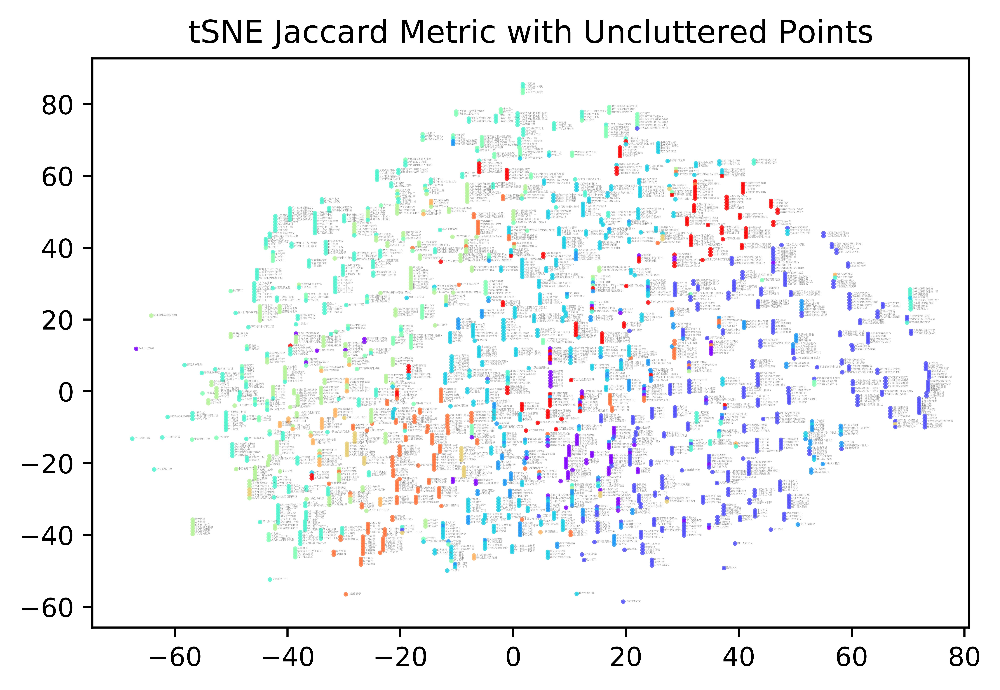

<Figure size 432x288 with 0 Axes>

In [19]:
tsne_jac_dep2,record_cluster = unclutter(tsne_jac_dep, linkcomp = 'centroid')

plot_result(tsne_jac_dep2[:,0], tsne_jac_dep2[:,1],record_cluster,
            colname_df['depname'], dep_color, addname = True, fontsize = 1, 
            title = 'tSNE Jaccard Metric with Uncluttered Points',
            markersize= 0.5, dpi = 1400, datascale = 1, outfn = 'univdep_tsne_jac1.png')